# Helmholtz's equation (Physics informed)

## Mapping sparse data $u(x,y)$ to the solution space

$$ \nabla^2 u(x,y) - k^2u = g(x,y) ~~~ x,y \in (0,1)^2$$ 

$$ u_{\text{bc}} = 0$$

Two gaussian source:
$$ \text{Data}: A \sim U(1,10), ~~x_0, y_0 \sim U(0.2, 0.8), \text{and  } sigma \sim U(0.05, 0.2)$$ 

Number of samples: 3000

In [1]:
from flax import linen as nn
from typing import Sequence, Tuple
import jax
import jax.numpy as jnp
from torch.utils import data
from functools import partial
import time
import optax
import scipy.io
import os
import matplotlib.pyplot as plt
import shutil
import pandas as pd
from jax import jvp
import pickle
from sklearn import metrics
from termcolor import colored
import random
import numpy as np
from scipy.interpolate import griddata
import matplotlib.tri as tri
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import MaxNLocator, ScalarFormatter

In [2]:
## All inputs

path_data = 'helmholtz_gaussian_sources_dataset.npz'

seed = 32
n_train = int(800*0.8)
batch_size = 75
n_sensors = 32*32 # (x*y)
branch_layers = [32, 32, 32]
branch_input_features = 1
trunk_layers = [32, 32, 32]
trunk_input_features = 2
hidden_dim = 100
p_test = 100
result_dir = './'
epochs = 80000
vis_iter = 1000
lr = 1e-3
transition_steps = 2000
decay_rate = 0.9


In [3]:

data_source = jnp.load(path_data, allow_pickle=True)

sources = data_source['sources']
solutions = data_source['solutions']
params_array = data_source['params_array']
params_array = jnp.array(params_array)

sensor_32x32 = data_source['sensor_32x32']
sensor_32x32_xcoords = data_source['sensor_32x32_xcoords']
sensor_32x32_ycoords = data_source['sensor_32x32_ycoords']
# sensor_5x5 = data_dline['sensor_5x5']
# sensor_5x5_xcoords = data_dline['sensor_5x5_xcoords']
# sensor_5x5_ycoords = data_dline['sensor_5x5_ycoords']


print("sources: ", sources.shape)
print("solutions: ", solutions.shape)
print("sensor_32x32: ", sensor_32x32.shape)
print("sensor_32x32_xcoords: ", sensor_32x32_xcoords.shape)
print("sensor_32x32_ycoords: ", sensor_32x32_ycoords.shape)

print("params_array: ", params_array.shape)

X_sensor = jnp.array(sensor_32x32).reshape(800, -1)   # (3000, 256)

x_coords = jnp.array(sensor_32x32_xcoords).reshape(-1)   # (256,)
y_coords = jnp.array(sensor_32x32_ycoords).reshape(-1)   # (256,)

sensor_xy = jnp.stack([x_coords, y_coords], axis=1)     # (256, 2)

Y_solutions = jnp.array(solutions).reshape(800, -1)      # (3000, 4096)

n = 64
x_lin = jnp.linspace(0, 1, n)
y_lin = jnp.linspace(0, 1, n)

Xg, Yg = jnp.meshgrid(x_lin, y_lin, indexing="xy")

solutions_xy = jnp.stack([Xg.reshape(-1), Yg.reshape(-1)], axis=1)   # (4096, 2)

print("X_sensor:", X_sensor.shape)
print("sensor_xy:", sensor_xy.shape)
print("Y_solutions:", Y_solutions.shape)
print("solutions_xy:", solutions_xy.shape)

2025-11-22 21:59:13.437494: W external/xla/xla/service/gpu/nvptx_compiler.cc:893] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version 12.6.68. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


sources:  (800, 64, 64)
solutions:  (800, 64, 64)
sensor_32x32:  (800, 32, 32)
sensor_32x32_xcoords:  (32, 32)
sensor_32x32_ycoords:  (32, 32)
params_array:  (800, 4)
X_sensor: (800, 1024)
sensor_xy: (1024, 2)
Y_solutions: (800, 4096)
solutions_xy: (4096, 2)



SAMPLE #0 - PARAMETERS

Source 1:
   Amplitude (A1):     2.5529
   Location (x1, y1):  (0.4821, 0.4546)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0022 / 2.5508
   Solution min/max:   0.0000 / 0.0983



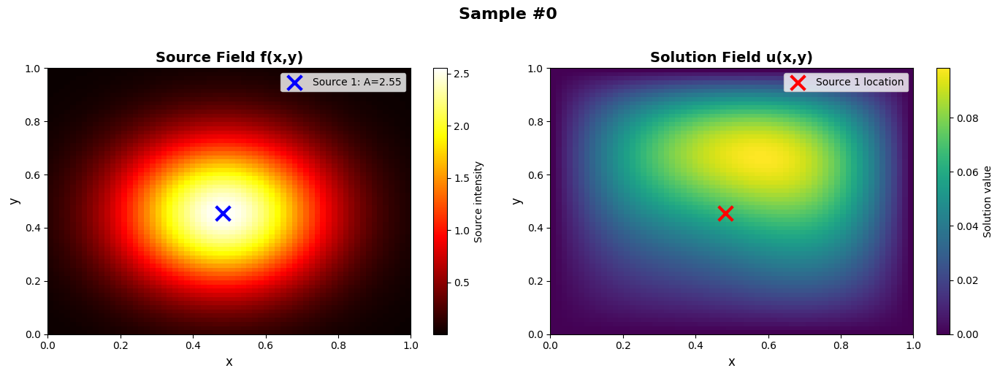


SAMPLE #1 - PARAMETERS

Source 1:
   Amplitude (A1):     3.8541
   Location (x1, y1):  (0.6398, 0.5225)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0008 / 3.8529
   Solution min/max:   -0.0497 / 0.2090



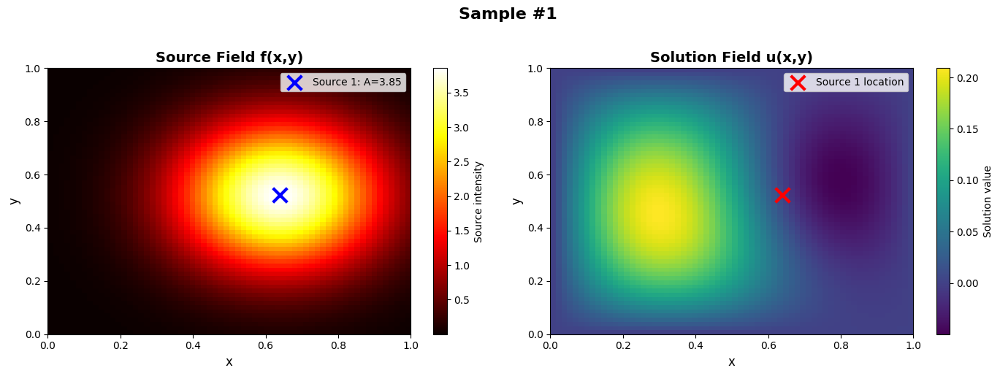


SAMPLE #2 - PARAMETERS

Source 1:
   Amplitude (A1):     2.5419
   Location (x1, y1):  (0.3726, 0.4240)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0003 / 2.5395
   Solution min/max:   -0.0428 / 0.1429



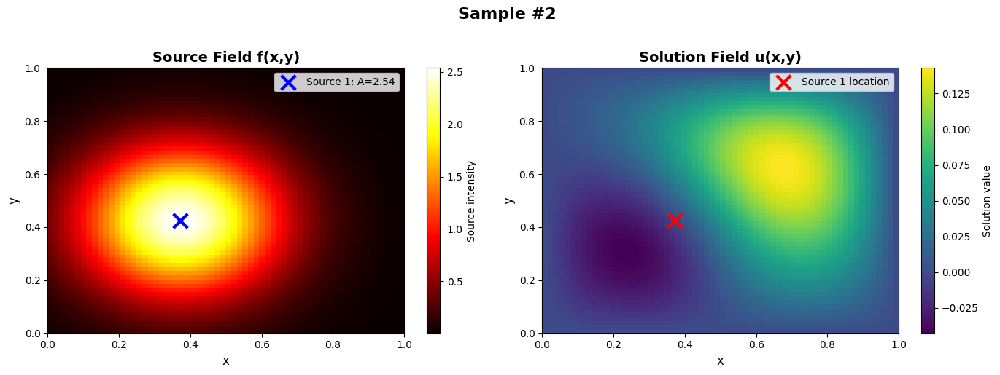

In [4]:
import matplotlib.pyplot as plt

def visualize_sample(idx, sources, solutions, params_array):
    """
    Visualize a single sample with source, solution, and parameters
    
    Parameters for 2 Gaussians:
    [A1, x1, y1, sigma1, A2, x2, y2, sigma2]
    """
    # Extract data
    source = sources[idx]
    solution = solutions[idx]
    params = params_array[idx]
    
    # Parse parameters
    A1, x1, y1, sigma1 = params[0:4]
    # A2, x2, y2, sigma2 = params[4:8]
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Plot 1: Source field f(x,y)
    im1 = axes[0].imshow(source, extent=[0, 1, 0, 1], origin='lower', 
                         cmap='hot', aspect='auto')
    axes[0].scatter([x1], [y1], c='blue', s=200, marker='x', linewidths=3, 
                    label=f'Source 1: A={A1:.2f}')
    # axes[0].scatter([x2], [y2], c='cyan', s=200, marker='x', linewidths=3, 
    #                 label=f'Source 2: A={A2:.2f}')
    axes[0].set_xlabel('x', fontsize=12)
    axes[0].set_ylabel('y', fontsize=12)
    axes[0].set_title(f'Source Field f(x,y)', fontsize=14, fontweight='bold')
    axes[0].legend(loc='upper right', fontsize=10)
    plt.colorbar(im1, ax=axes[0], label='Source intensity')
    
    # Plot 2: Solution field u(x,y)
    im2 = axes[1].imshow(solution, extent=[0, 1, 0, 1], origin='lower', 
                         cmap='viridis', aspect='auto')
    axes[1].scatter([x1], [y1], c='red', s=200, marker='x', linewidths=3, 
                    label='Source 1 location')
    # axes[1].scatter([x2], [y2], c='orange', s=200, marker='x', linewidths=3, 
    #                 label='Source 2 location')
    axes[1].set_xlabel('x', fontsize=12)
    axes[1].set_ylabel('y', fontsize=12)
    axes[1].set_title(f'Solution Field u(x,y)', fontsize=14, fontweight='bold')
    axes[1].legend(loc='upper right', fontsize=10)
    plt.colorbar(im2, ax=axes[1], label='Solution value')
    
    plt.suptitle(f'Sample #{idx}', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    
    # Print parameters
    print(f"\n{'='*60}")
    print(f"SAMPLE #{idx} - PARAMETERS")
    print(f"{'='*60}")
    print(f"\nSource 1:")
    print(f"   Amplitude (A1):     {A1:.4f}")
    print(f"   Location (x1, y1):  ({x1:.4f}, {y1:.4f})")
    print(f"   Width (σ1):         {sigma1:.4f}")
    
    # print(f"\n Source 2:")
    # print(f"   Amplitude (A2):     {A2:.4f}")
    # print(f"   Location (x2, y2):  ({x2:.4f}, {y2:.4f})")
    # print(f"   Width (σ2):         {sigma2:.4f}")
    
    print(f"\n Statistics:")
    print(f"   Source min/max:     {source.min():.4f} / {source.max():.4f}")
    print(f"   Solution min/max:   {solution.min():.4f} / {solution.max():.4f}")
    # print(f"   Distance between sources: {np.sqrt((x2-x1)**2 + (y2-y1)**2):.4f}")
    print(f"{'='*60}\n")
    
    return fig


# Visualize first 3 samples
for i in range(3):
    i*10
    fig = visualize_sample(i, sources, solutions, params_array)
    plt.savefig(f'sample_{i}.png', dpi=150, bbox_inches='tight')
    plt.show()

In [5]:
# Shuffle the data
indices = np.arange(X_sensor.shape[0])
np.random.shuffle(indices)

shuffled_sensor_data = X_sensor[indices]
shuffled_solution_data = Y_solutions[indices]
shuffled_param_data = params_array[indices]

# Split
X_train = shuffled_sensor_data[:n_train]
X_test = shuffled_sensor_data[n_train:]

y_train = shuffled_sensor_data[:n_train]
y_test = shuffled_solution_data[n_train:]

param_train = shuffled_param_data[:n_train]
param_test = shuffled_param_data[n_train:]


print("X_train: ", str(X_train.shape))
print("X_test: ", str(X_test.shape))

print("y_train: ", str(y_train.shape))
print("y_test: ", str(y_test.shape))

print("param_train: ", str(param_train.shape))
print("param_test: ", str(param_test.shape))

X_train:  (640, 1024)
X_test:  (160, 1024)
y_train:  (640, 1024)
y_test:  (160, 4096)
param_train:  (640, 4)
param_test:  (160, 4)


In [6]:
# Data Generator
class DataGenerator(data.Dataset):
    def __init__(self, u_data, y, s, param, batch_size, gen_key):
        self.u_data = u_data
        self.y = y
        self.s = s
        self.param = param
        self.N = u_data.shape[0]
        self.batch_size = batch_size
        self.key = gen_key

    def __getitem__(self, index):
        """Generate one batch of data"""
        self.key, subkey = jax.random.split(self.key)
        inputs, outputs = self.__data_generation(subkey)
        return inputs, outputs

    @partial(jax.jit, static_argnums=(0,))
    def __data_generation(self, key_i):
        """Generates data containing batch_size samples"""
        idx = jax.random.choice(key_i, self.N, (self.batch_size,), replace=False)
        s = self.s[idx, :]
        y = self.y[:, :]
        u_data = self.u_data[idx]
        param = self.param[idx]
        # Construct batch
        inputs = (u_data, y, param)
        outputs = s
        return inputs, outputs

In [7]:
"""# Data generation for each sample"""

key = jax.random.PRNGKey(seed)
keys = jax.random.split(key, 6)


data_dataset = DataGenerator(X_train, sensor_xy, y_train, param_train, batch_size, keys[0])




In [8]:
class DeepONet(nn.Module):
    branch_layers: Sequence[int]
    trunk_layers: Sequence[int]
    output_dim: int = 1

    @nn.compact
    def __call__(self, branch_x, trunk_x):

        init = nn.initializers.glorot_normal()

        if branch_x.ndim == 1:
            branch_x = jnp.expand_dims(branch_x, axis=-1)

        for i, fs in enumerate(self.branch_layers[:-1]):
            # residual = branch_x
            branch_x = nn.Dense(fs, kernel_init=init, name=f"branch_{i}")(branch_x)
            branch_x = nn.activation.tanh(branch_x)
            
            # residual = nn.Dense(fs, kernel_init=init, name=f"branch_proj_{i}")(residual)
            # branch_x = branch_x + residual
        branch_x = nn.Dense(self.branch_layers[-1], name=f"branch_{i+1}", kernel_init=init)(branch_x)

        if trunk_x.ndim == 1:
            trunk_x = jnp.expand_dims(trunk_x, axis=0)


        for i, fs in enumerate(self.trunk_layers):
            trunk_x = nn.Dense(fs, kernel_init=init, name=f"trunk_{i}")(trunk_x)
            trunk_x = nn.activation.tanh(trunk_x)


         # [x_num, p]

        # Compute the final output
        # Input shapes:
        # branch: [batch_size, p]
        # trunk: [x_num, p]
        # output: [batch_size, x_num]
        result = jnp.einsum('ij,kj->ik', branch_x, trunk_x)

        # Add bias
        bias = self.param('output_bias', nn.initializers.zeros, (self.output_dim,))
        result += bias

        return result

In [9]:
"""# Helper functions"""

@partial(jax.jit)
def mse(y_true, y_pred):
    return jnp.mean(jnp.square(y_true - y_pred))

@partial(jax.jit)
def mse_single(y_pred):
    return jnp.mean(jnp.square(y_pred))

@partial(jax.jit, static_argnums=(0,))
def apply_net(model_fn, params, branch_input, *trunk_in):
    if len(trunk_in) == 1:
        trunk_input = trunk_in[0]
    else:
        trunk_input = jnp.stack(trunk_in, axis=-1)
    out = model_fn(params, branch_input, trunk_input)

    if out.shape[1]==1:
        out = jnp.squeeze(out, axis=1)
    return out


@partial(jax.jit, static_argnums=(0, 1, 2))
def step(optimizer, loss_fn, model_fn, opt_state, params_step, data_batch):
    loss, gradient = jax.value_and_grad(loss_fn, argnums=1)(model_fn, params_step, data_batch)
    updates, opt_state = optimizer.update(gradient, opt_state)
    params_step = optax.apply_updates(params_step, updates)

    return loss, params_step, opt_state

In [10]:
"""# Loss functions"""

def loss_data(model_fn, params, data_batch):

    inputs, outputs = data_batch
    u_data, cord, _ = inputs

    x = cord[:, 0]
    y = cord[:, 1]

    s_pred = apply_net(model_fn, params, u_data, x, y)

    loss = mse(outputs, s_pred)
    return loss

def loss_fn(model_fn, params, data_batch):
    loss_data_i = loss_data(model_fn, params, data_batch)
    loss_value = loss_data_i
    return loss_value

In [11]:
"""# Initialize the model"""

# Initialize model and params
# make sure trunk_layers and branch_layers are lists
trunk_layers = [trunk_layers] if isinstance(trunk_layers, int) else trunk_layers

branch_layers = [branch_layers] if isinstance(branch_layers, int) else branch_layers

# add output features to trunk and branch layers
trunk_layers = trunk_layers + [hidden_dim]
branch_layers = branch_layers + [hidden_dim]

# Convert list to tuples
trunk_layers = tuple(trunk_layers)
branch_layers = tuple(branch_layers)

num_outputs = 1
model = DeepONet(branch_layers, trunk_layers, num_outputs)

params = model.init(key, jnp.ones(shape=(1, n_sensors * branch_input_features)),
                    jnp.ones(shape=(1, trunk_input_features)))

# Print model from parameters
print('--- model_summary ---')
# count total params
total_params = sum(x.size for x in jax.tree_util.tree_leaves(params))
print(f'total params: {total_params}')
print('--- model_summary ---')

# model function
model_fn = jax.jit(model.apply)


2025-11-22 21:59:17.536258: E external/xla/xla/service/hlo_lexer.cc:438] Failed to parse int literal: 894515288310727292233


--- model_summary ---
total params: 43721
--- model_summary ---


In [12]:
"""# Test error function"""

def loss_test_l2_error(model_fn, params, X_test, y_test, full_solution_coordinates, return_data=False):

    x = full_solution_coordinates[:,0]
    y = full_solution_coordinates[:,1]

    def ff_net(x, y):
        s_pred = apply_net(model_fn, params, X_test, x, y)
        return s_pred

    s_pred = ff_net(x, y)

    loss_test = mse(y_test, s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(jax.vmap(l2_norm_error)(y_test, s_pred))

    if return_data:
        return loss_test, l2_error, s_pred
    else:
        return loss_test, l2_error

In [13]:
"""# Define optimiser"""

# Define optimizer with optax (ADAM)
# optimizer

lr_scheduler = optax.exponential_decay(lr, transition_steps, decay_rate)

optimizer = optax.adam(learning_rate=lr_scheduler)
opt_state = optimizer.init(params)

# Data
data_data = iter(data_dataset)

# create dir for saving results
result_dir = os.path.join(os.getcwd(), os.path.join(result_dir, f"solution_op_{seed}"))
log_file = os.path.join(result_dir, 'log.csv')
# Create directory
if not os.path.exists(result_dir):
    os.makedirs(result_dir)
if os.path.exists(os.path.join(result_dir, 'vis')):
    shutil.rmtree(os.path.join(result_dir, 'vis'))
if os.path.exists(log_file):
    os.remove(log_file)


with open(log_file, 'a') as f:
    f.write('epoch,loss,loss_data_value,l2err_test,loss_test,runtime\n')

In [14]:
"""# model save function"""

def save_model_params(params, result_dir, filename='model_params.pkl'):
    if not os.path.exists(result_dir):
        os.makedirs(result_dir)

    save_path = os.path.join(result_dir, filename)
    with open(save_path, 'wb') as f:
        pickle.dump(params, f)

def load_model_params(result_dir, filename='model_params_best.pkl'):
    load_path = os.path.join(result_dir, filename)
    with open(load_path, 'rb') as f:
        params = pickle.load(f)
    return params

# Usage:
save = True
# Saving
if save:
    save_model_params(params, result_dir)

In [15]:
"""# Training loop"""

# Iterations
epochs = epochs  # Assuming 'epochs' is defined elsewhere
log_iter = 1000
best_test_mse = float('inf')  # Initialize with infinity
# Save initial model at 0th iteration
save_model_params(params, result_dir, filename='model_params_best.pkl')
print("Saved initial model at iteration 0")
# Training loop
for it in range(epochs):
    if it == 1:
        # start timer and exclude first iteration (compile time)
        start = time.time()
    # Fetch data
    data_batch = next(data_data)
    
    # Do Step
    loss, params, opt_state = step(optimizer, loss_fn, model_fn, opt_state,
                                   params, data_batch)
    if it % log_iter == 0:
        # Compute losses
        loss = loss_fn(model_fn, params, data_batch)
        loss_data_value = loss_data(model_fn, params, data_batch)
        
        # Calculate loss and l2 error for test samples
        loss_test, l2_error = loss_test_l2_error(model_fn, params, X_test, y_test, solutions_xy, return_data=False)

        if loss_test < best_test_mse:
            best_test_mse = loss_test
            # Save the model as it's the best so far
            save_model_params(params, result_dir, filename='model_params_best.pkl')
            print(f"New best model saved at iteration {it} with test MSE: {loss_test:.2e}")

        # get runtime
        if it == 0:
            runtime = 0
        else:
            runtime = time.time() - start

        # Print losses
        print(f"Iteration {it+1}/{epochs}")
        print(f"Trian_loss: {loss:.2e}, "
              f"loss_data: {loss_data_value:.2e}, l2_err_test: {l2_error:.2e}, test_loss: {loss_test:.2e} , runtime: {runtime:06.2f}")

        # Save results
        with open(log_file, 'a') as f:
            f.write(f'{it+1}, {loss}, '
                    f'{loss_data_value}, {l2_error}, {loss_test}, {runtime}\n')

# Save results
runtime = time.time() - start
# Save initial model at 0th iteration
save_model_params(params, result_dir, filename='model_params_last.pkl')
print("Saved model at end of training")
with open(log_file, 'a') as f:
    f.write(f'{it + 1}, {loss}, '
            f'{loss_data_value}, {l2_error}, {loss_test}, {runtime}\n')

Saved initial model at iteration 0
New best model saved at iteration 0 with test MSE: 2.66e-02
Iteration 1/80000
Trian_loss: 2.87e-02, loss_data: 2.87e-02, l2_err_test: 1.95e+00, test_loss: 2.66e-02 , runtime: 000.00
New best model saved at iteration 1000 with test MSE: 1.47e-03
Iteration 1001/80000
Trian_loss: 1.46e-03, loss_data: 1.46e-03, l2_err_test: 4.08e-01, test_loss: 1.47e-03 , runtime: 000.78
New best model saved at iteration 2000 with test MSE: 1.37e-03
Iteration 2001/80000
Trian_loss: 1.28e-03, loss_data: 1.28e-03, l2_err_test: 3.93e-01, test_loss: 1.37e-03 , runtime: 001.55
New best model saved at iteration 3000 with test MSE: 2.08e-04
Iteration 3001/80000
Trian_loss: 1.80e-04, loss_data: 1.80e-04, l2_err_test: 1.63e-01, test_loss: 2.08e-04 , runtime: 002.31
New best model saved at iteration 4000 with test MSE: 9.78e-05
Iteration 4001/80000
Trian_loss: 8.49e-05, loss_data: 8.49e-05, l2_err_test: 1.11e-01, test_loss: 9.78e-05 , runtime: 003.08
Iteration 5001/80000
Trian_loss

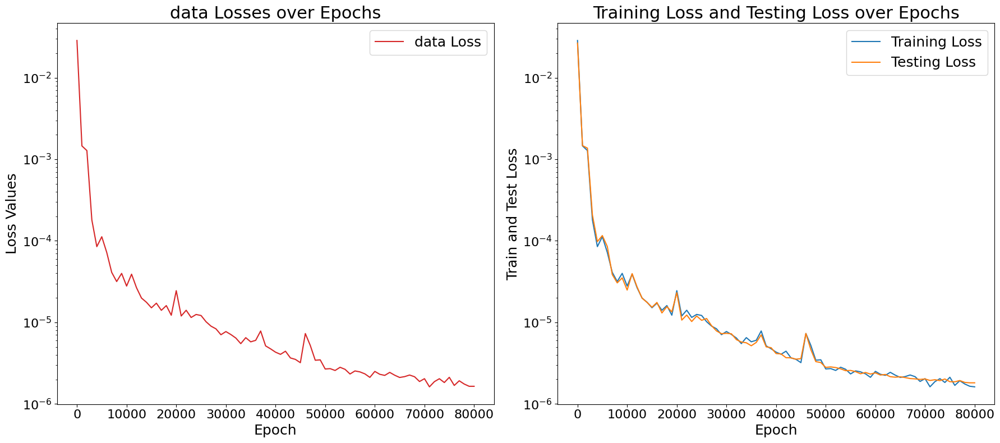

Plots saved to /scratch4/sgoswam4/Dibakar/INV_DON/helmholtz_source_ID/./solution_op_32/train_and_test_loss_plots.png


In [16]:
"""# Loss plots"""

# Set the result directory

# Read the CSV file
csv_file = os.path.join(result_dir, "log.csv")  # Assuming the file is named "log.csv"
df = pd.read_csv(csv_file)

# Create the figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), dpi=100)

# Set color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Left plot: epoch vs loss_
ax1.plot(df['epoch'], df['loss_data_value'], label='data Loss', color=colors[3], linestyle='-')
ax1.set_yscale("log")
ax1.set_xlabel('Epoch', fontsize=18)
ax1.set_ylabel('Loss Values', fontsize=18)
ax1.set_title('data Losses over Epochs', fontsize=22)
ax1.legend(loc='best', fontsize=18)
ax1.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Right plot: epoch vs loss and l2err_val
ax2.plot(df['epoch'], df['loss'], label='Training Loss', color=colors[0], linestyle='-')
ax2.plot(df['epoch'], df['loss_test'], label='Testing Loss', color=colors[1], linestyle='-')
ax2.set_yscale("log")
ax2.set_xlabel('Epoch', fontsize=18)
ax2.set_ylabel('Train and Test Loss', fontsize=18)
ax2.set_title('Training Loss and Testing Loss over Epochs', fontsize=22)
ax2.legend(loc='best', fontsize=18)
ax2.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Adjust layout and save the figure
plt.tight_layout()
output_file = os.path.join(result_dir, "train_and_test_loss_plots.png")
plt.savefig(output_file, dpi=100)
plt.show()
plt.close()

print(f"Plots saved to {output_file}")

In [17]:
params = load_model_params(result_dir)

loss_test, l2_error, s_pred = loss_test_l2_error(model_fn, params, X_test, y_test, solutions_xy, return_data=True)

In [18]:
s_pred.shape, y_test.shape

((160, 4096), (160, 4096))

(160, 4)
(4,)


/tmp/ipykernel_2191649/3002288527.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


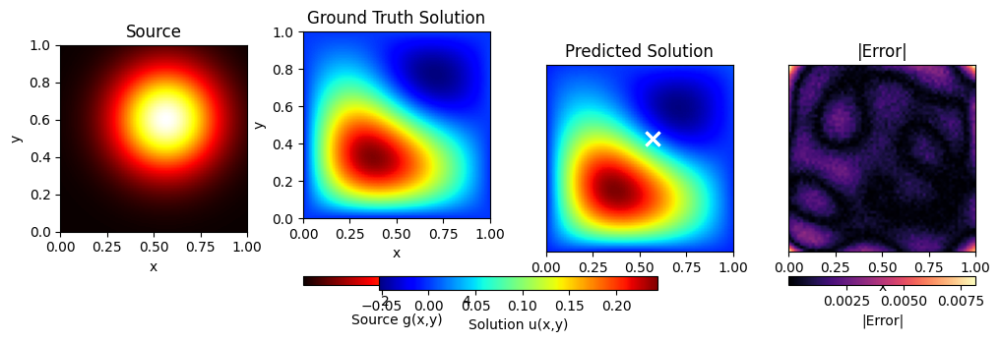


Sample #200 - Parameter Comparison

Source 1:
  Amplitude (A₁): 4.5744
  Location (x₁, y₁): (0.5682, 0.6054)
  Width (σ₁): 0.2000




In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Grid setup
Nx = 64
Ny = 64
sample_idx = 200

# Coordinates (4096,)
x = solutions_xy[:, 0]
y = solutions_xy[:, 1]

# Ground truth and prediction (4096,)
gt = y_test[sample_idx]
pred = s_pred[sample_idx]
param_i = param_test[sample_idx]

print(param_test.shape)
# ============================================================
# UPDATED: Gaussian source reconstruction (replaces reconstruct_dline)
# ============================================================
def gaussian_source(x, y, A, x0, y0, sigma):
    """Single Gaussian source"""
    return A * np.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))

def multi_gaussian_source(X, Y, params):
    """
    params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
    """
    n_sources = len(params) // 4
    f = np.zeros_like(X)
    
    for i in range(n_sources):
        A = params[4*i]
        x0 = params[4*i + 1]
        y0 = params[4*i + 2]
        sigma = params[4*i + 3]
        
        f += gaussian_source(X, Y, A, x0, y0, sigma)
    
    return f

def reconstruct_gaussian_source(params, n=64):
    """Reconstruct source field from parameters"""
    x = np.linspace(0, 1, n)
    y = np.linspace(0, 1, n)
    X, Y = np.meshgrid(x, y)
    
    source_rec = multi_gaussian_source(X, Y, params)
    return source_rec

# ============================================================
# UPDATED: Unpack 8 parameters instead of 5
# ============================================================
print(param_i.shape)
# A1, x1, y1, sigma1, A2, x2, y2, sigma2 = param_i
A1, x1, y1, sigma1 = param_i

source_rec = reconstruct_gaussian_source(param_i)

# Rest is the same
error = np.abs(pred - gt)
vmin = min(pred.min(), gt.min())
vmax = max(pred.max(), gt.max())
err_min = error.min()
err_max = error.max()

# Reshape into 64x64 grids
Xg = x.reshape(Nx, Ny)
Yg = y.reshape(Nx, Ny)
GT_grid   = gt.reshape(Nx, Ny)
Pred_grid = pred.reshape(Nx, Ny)
Err_grid  = error.reshape(Nx, Ny)

fig, axes = plt.subplots(
    1, 4, figsize=(12, 4),
    gridspec_kw={'width_ratios': [1, 1, 1, 1], 'wspace': 0.3}
)

# ----------------------------------------------------------
# Source
# ----------------------------------------------------------
source_plt = axes[0].imshow(
    source_rec, origin='lower', extent=[0,1,0,1],
    cmap='hot', aspect='equal'
)
# UPDATED: Title
axes[0].set_title("Source", fontsize=12)
axes[0].set_xlabel("x")
axes[0].set_ylabel("y")

# OPTIONAL: Add source locations
# axes[0].scatter([x1, x2], [y1, y2], c='white', s=100, marker='x', linewidths=2)
axes[2].scatter([x1], [y1], c='white', s=100, marker='x', linewidths=2)



# ----------------------------------------------------------
# Ground Truth
# ----------------------------------------------------------
cont_gt = axes[1].imshow(
    GT_grid, origin='lower', extent=[0,1,0,1],
    cmap='jet', vmin=vmin, vmax=vmax, aspect='equal'
)
# UPDATED: Title
axes[1].set_title("Ground Truth Solution", fontsize=12)
axes[1].set_xlabel("x")
axes[1].set_ylabel("y")

# OPTIONAL: Add source locations
# axes[1].scatter([x1, x2], [y1, y2], c='white', s=100, marker='x', linewidths=2)
axes[2].scatter([x1], [y1], c='white', s=100, marker='x', linewidths=2)


# ----------------------------------------------------------
# Prediction
# ----------------------------------------------------------
cont_pred = axes[2].imshow(
    Pred_grid, origin='lower', extent=[0,1,0,1],
    cmap='jet', vmin=vmin, vmax=vmax, aspect='equal'
)
# UPDATED: Title
axes[2].set_title("Predicted Solution", fontsize=12)
axes[2].set_xlabel("x")
axes[2].set_yticks([])

# OPTIONAL: Add source locations
# axes[2].scatter([x1, x2], [y1, y2], c='white', s=100, marker='x', linewidths=2)
axes[2].scatter([x1], [y1], c='white', s=100, marker='x', linewidths=2)


# ----------------------------------------------------------
# Error
# ----------------------------------------------------------
cont_err = axes[3].imshow(
    Err_grid, origin='lower', extent=[0,1,0,1],
    cmap='magma', vmin=err_min, vmax=err_max, aspect='equal'
)
axes[3].set_title("|Error|", fontsize=12)
axes[3].set_xlabel("x")
axes[3].set_yticks([])

# ----------------------------------------------------------
# Colorbars
# ----------------------------------------------------------
cbar1 = fig.colorbar(source_plt, ax=axes[1], orientation='horizontal',
                     fraction=0.046, pad=0.08)
# UPDATED: Label
cbar1.set_label("Source g(x,y)", fontsize=10)


cbar2 = fig.colorbar(cont_pred, ax=axes[1:3], orientation='horizontal',
                     fraction=0.046, pad=0.08)
# UPDATED: Label
cbar2.set_label("Solution u(x,y)", fontsize=10)

cbar3 = fig.colorbar(cont_err, ax=axes[3], orientation='horizontal',
                     fraction=0.046, pad=0.08)
cbar3.set_label("|Error|", fontsize=10)

plt.tight_layout()
plt.show()

# ============================================================
# OPTIONAL: Print parameter comparison
# ============================================================
print(f"\n{'='*60}")
print(f"Sample #{sample_idx} - Parameter Comparison")
print(f"{'='*60}")
print(f"\nSource 1:")
print(f"  Amplitude (A₁): {A1:.4f}")
print(f"  Location (x₁, y₁): ({x1:.4f}, {y1:.4f})")
print(f"  Width (σ₁): {sigma1:.4f}")

# print(f"\nSource 2:")
# print(f"  Amplitude (A₂): {A2:.4f}")
# print(f"  Location (x₂, y₂): ({x2:.4f}, {y2:.4f})")
# print(f"  Width (σ₂): {sigma2:.4f}")

print(f"\n{'='*60}\n")

Sample:  0


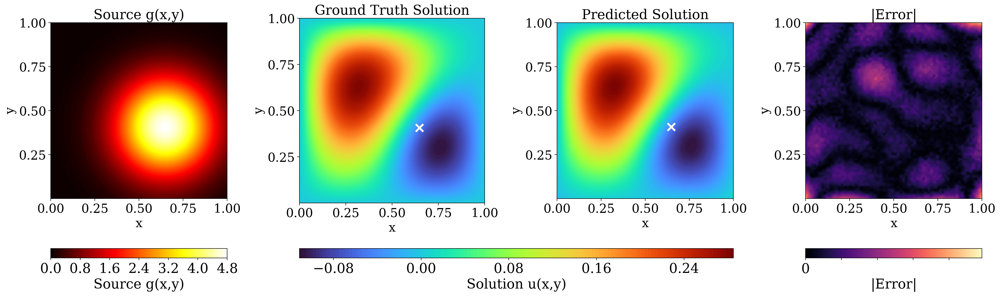


Sample #0 - Parameter Comparison

Source 1:
  Amplitude (A₁): 4.7648
  Location (x₁, y₁): (0.6475, 0.4075)
  Width (σ₁): 0.2000


Sample:  1


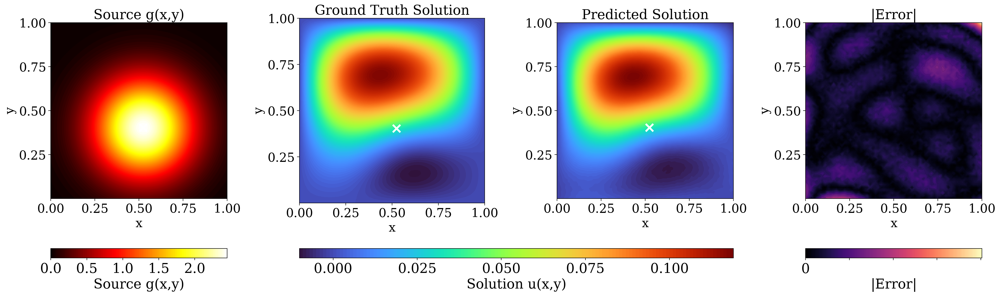


Sample #1 - Parameter Comparison

Source 1:
  Amplitude (A₁): 2.4482
  Location (x₁, y₁): (0.5237, 0.4031)
  Width (σ₁): 0.2000


Sample:  2


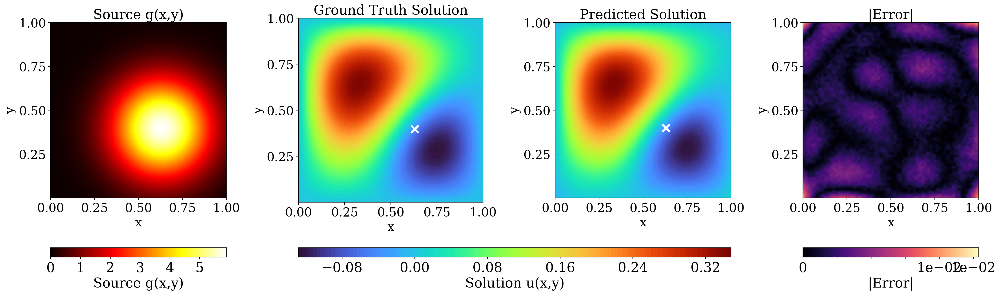


Sample #2 - Parameter Comparison

Source 1:
  Amplitude (A₁): 5.8565
  Location (x₁, y₁): (0.6298, 0.3979)
  Width (σ₁): 0.2000


Sample:  3


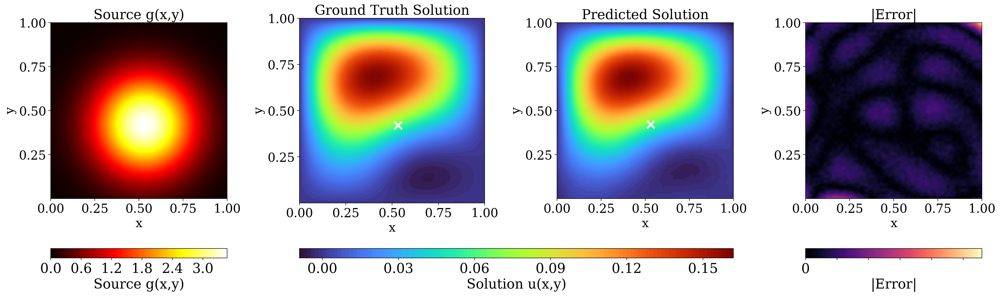


Sample #3 - Parameter Comparison

Source 1:
  Amplitude (A₁): 3.4846
  Location (x₁, y₁): (0.5315, 0.4204)
  Width (σ₁): 0.2000


Sample:  4


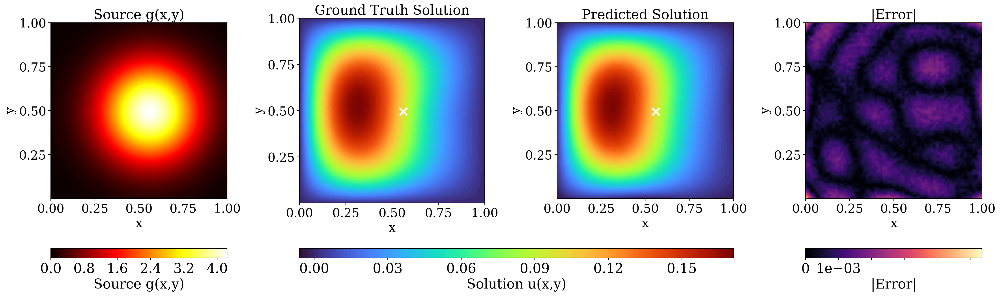


Sample #4 - Parameter Comparison

Source 1:
  Amplitude (A₁): 4.2083
  Location (x₁, y₁): (0.5603, 0.4941)
  Width (σ₁): 0.2000


Sample:  5


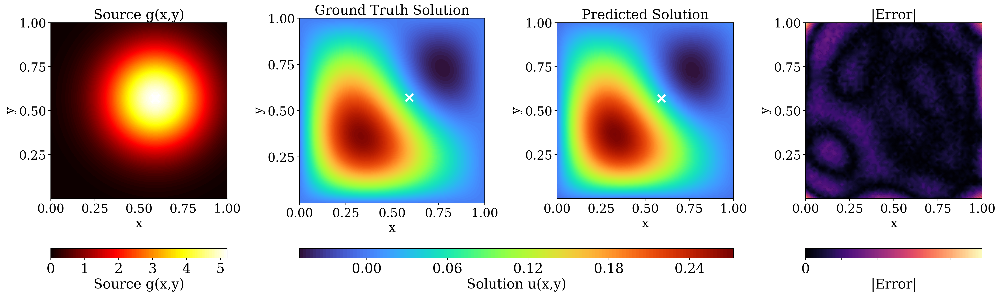


Sample #5 - Parameter Comparison

Source 1:
  Amplitude (A₁): 5.1792
  Location (x₁, y₁): (0.5926, 0.5701)
  Width (σ₁): 0.2000


Sample:  6


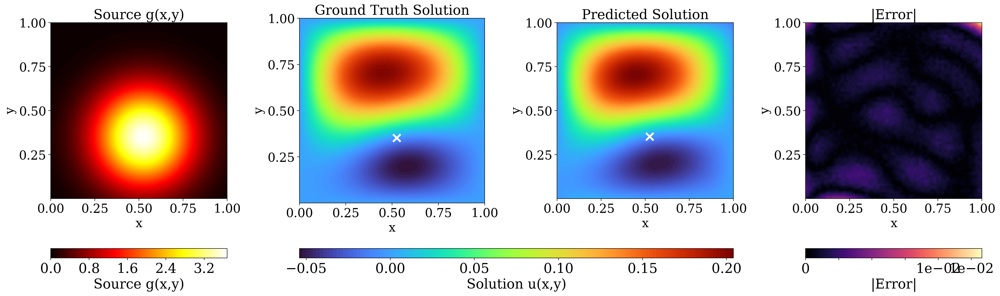


Sample #6 - Parameter Comparison

Source 1:
  Amplitude (A₁): 3.6475
  Location (x₁, y₁): (0.5251, 0.3517)
  Width (σ₁): 0.2000


Sample:  7


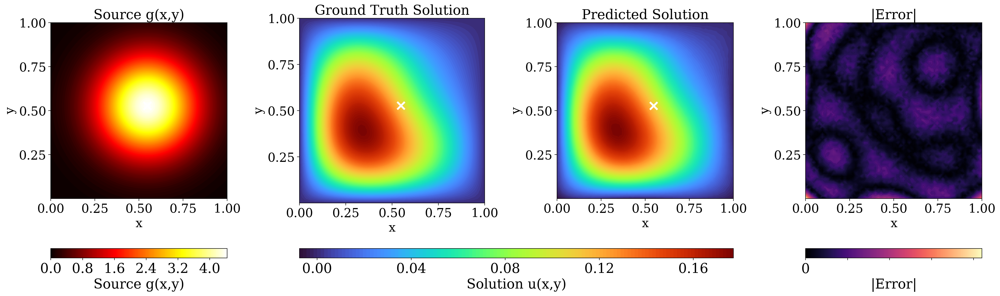


Sample #7 - Parameter Comparison

Source 1:
  Amplitude (A₁): 4.4281
  Location (x₁, y₁): (0.5472, 0.5269)
  Width (σ₁): 0.2000


Sample:  8


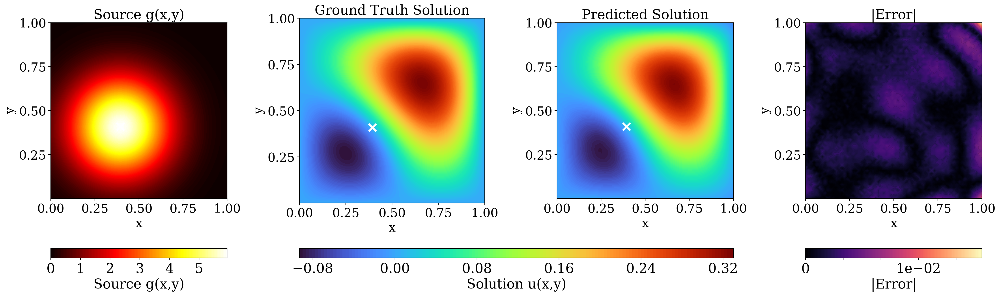


Sample #8 - Parameter Comparison

Source 1:
  Amplitude (A₁): 5.9418
  Location (x₁, y₁): (0.3941, 0.4081)
  Width (σ₁): 0.2000


Sample:  9


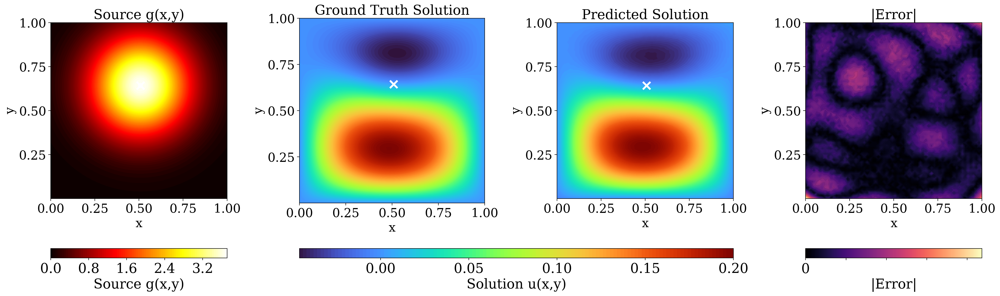


Sample #9 - Parameter Comparison

Source 1:
  Amplitude (A₁): 3.6928
  Location (x₁, y₁): (0.5077, 0.6429)
  Width (σ₁): 0.2000




In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.gridspec as gridspec
from matplotlib.tri import Triangulation
from matplotlib.colors import Normalize, LogNorm

# Global fonts
tex_fonts = {
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "axes.titlesize": 22,
    "axes.labelsize": 22,
    "font.size": 20,
    "xtick.labelsize": 22,
    "ytick.labelsize": 22,
    "legend.fontsize": 20,
}
plt.rcParams.update(tex_fonts)

# ============================================================
# Gaussian source reconstruction
# ============================================================
def gaussian_source(x, y, A, x0, y0, sigma):
    """Single Gaussian source"""
    return A * np.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))

def multi_gaussian_source(X, Y, params):
    """
    params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
    """
    n_sources = len(params) // 4
    f = np.zeros_like(X)
    
    for i in range(n_sources):
        A = params[4*i]
        x0 = params[4*i + 1]
        y0 = params[4*i + 2]
        sigma = params[4*i + 3]
        
        f += gaussian_source(X, Y, A, x0, y0, sigma)
    
    return f

def reconstruct_gaussian_source(params, n=64):
    """Reconstruct source field from parameters"""
    x = np.linspace(0, 1, n)
    y = np.linspace(0, 1, n)
    X, Y = np.meshgrid(x, y)
    
    source_rec = multi_gaussian_source(X, Y, params)
    return source_rec

# ============================================================
# Build triangulation once
# ============================================================
x_all = solutions_xy[:, 0]
y_all = solutions_xy[:, 1]
tri = Triangulation(x_all, y_all)

# Optional: mask bad triangles if NaNs in data
if hasattr(tri, "mask") and tri.mask is None:
    tri.set_mask(np.zeros(len(tri.triangles), dtype=bool))

# ============================================================
# Loop through samples
# ============================================================
for sample_idx in range(10):
    
    print("Sample: ", sample_idx)
    
    # Get data
    gt = y_test[sample_idx]          # ground truth solution values at points
    pred = s_pred[sample_idx]        # predicted solution values at points
    param_i = param_test[sample_idx]
    
    # Unpack 8 parameters
    # A1, x1, y1, sigma1, A2, x2, y2, sigma2 = param_i
    A1, x1, y1, sigma1 = param_i
    
    
    # Reconstruct source field on regular grid
    source_rec = reconstruct_gaussian_source(param_i, n=64)
    source_flat = source_rec.reshape(-1)
    
    # Compute error
    error = np.abs(pred - gt)
    
    # Normalizations for solution field
    smin = float(min(gt.min(), pred.min()))
    smax = float(max(gt.max(), pred.max()))
    snorm = Normalize(vmin=smin, vmax=smax)
    
    # Normalizations for error (with log scale if needed)
    emin, emax = float(error.min()), float(error.max())
    if emax > 0 and emin > 0 and (emax / max(emin, 1e-12) > 100):
        enorm = LogNorm(vmin=max(emin, 1e-6), vmax=emax)
        err_cbar_fmt = ticker.LogFormatter(10)
    else:
        enorm = Normalize(vmin=emin, vmax=emax)
        err_cbar_fmt = ticker.ScalarFormatter(useMathText=True)
    
    # ============================================================
    # Figure with constrained layout
    # ============================================================
    fig = plt.figure(figsize=(28, 7), dpi=200)
    gs = fig.add_gridspec(
        2, 6,
        height_ratios=[20, 1],
        width_ratios=[1, 1.05, 1, 1, 0.25, 0.25]
    )
    
    # Top row plots
    ax_source = fig.add_subplot(gs[0, 0])
    ax_gt     = fig.add_subplot(gs[0, 1])
    ax_pred   = fig.add_subplot(gs[0, 2])
    ax_err    = fig.add_subplot(gs[0, 3])
    
    # Bottom row colorbars
    cax_source = fig.add_subplot(gs[1, 0])
    cax_sol    = fig.add_subplot(gs[1, 1:3])
    cax_err    = fig.add_subplot(gs[1, 3])
    
    # ============================================================
    # Source field
    # ============================================================
    im_source = ax_source.tricontourf(tri, source_flat, levels=120, cmap="hot")
    ax_source.set_title("Source g(x,y)", pad=6)
    ax_source.set_aspect("equal")
    ax_source.set_xlim(0, 1)
    ax_source.set_ylim(0, 1)
    
    # Add source locations
    # ax_source.scatter([x1, x2], [y1, y2], c='cyan', s=150, marker='x', 
    #                  linewidths=3, edgecolors='white', zorder=10)
    ax_source.scatter([x1], [y1], c='white', s=150, marker='x', 
                   linewidths=3, zorder=10)
    
    # ============================================================
    # Ground truth solution
    # ============================================================
    im_gt = ax_gt.tricontourf(tri, gt, levels=150, cmap="turbo", norm=snorm)
    ax_gt.set_title("Ground Truth Solution", pad=6)
    ax_gt.set_aspect("equal")
    ax_gt.set_xlim(0, 1)
    ax_gt.set_ylim(0, 1)
    
    # Add source locations
    # ax_gt.scatter([x1, x2], [y1, y2], c='white', s=150, marker='x', 
    #              linewidths=3, zorder=10)
    ax_gt.scatter([x1], [y1], c='white', s=150, marker='x', 
                   linewidths=3, zorder=10)
    
    # ============================================================
    # Predicted solution
    # ============================================================
    im_pred = ax_pred.tricontourf(tri, pred, levels=150, cmap="turbo", norm=snorm)
    ax_pred.set_title("Predicted Solution", pad=6)
    ax_pred.set_aspect("equal")
    ax_pred.set_xlim(0, 1)
    ax_pred.set_ylim(0, 1)
    
    # Add source locations
    # ax_pred.scatter([x1, x2], [y1, y2], c='white', s=150, marker='x', 
    #                linewidths=3, zorder=10)
    ax_pred.scatter([x1], [y1], c='white', s=150, marker='x', 
                   linewidths=3, zorder=10)
    # ============================================================
    # Error
    # ============================================================
    im_err = ax_err.tricontourf(tri, error, levels=150, cmap="magma")
    ax_err.tricontour(tri, error, levels=12, linewidths=0.4, colors="k", alpha=0.15)
    ax_err.set_title("|Error|", pad=6)
    ax_err.set_aspect("equal")
    ax_err.set_xlim(0, 1)
    ax_err.set_ylim(0, 1)
    
    # ============================================================
    # Axis labels and ticks
    # ============================================================
    for ax in [ax_source, ax_gt, ax_pred, ax_err]:
        ax.set_xlabel("x", fontsize=20)
        ax.set_ylabel("y", fontsize=20)
        ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=4))
        ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=4, prune="lower"))
        ax.tick_params(axis="both", which="major", length=4, labelsize=20)
    
    # ============================================================
    # Colorbars
    # ============================================================
    cbar_source = fig.colorbar(im_source, cax=cax_source, orientation="horizontal")
    cbar_source.set_label("Source g(x,y)")
    cbar_source.ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    
    cbar_sol = fig.colorbar(im_pred, cax=cax_sol, orientation="horizontal")
    cbar_sol.set_label("Solution u(x,y)")
    cbar_sol.ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    
    cbar_error = fig.colorbar(im_err, cax=cax_err, orientation="horizontal", format=err_cbar_fmt)
    cbar_error.set_label("|Error|")
    cbar_error.ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    
    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.5)
    plt.show()
    # fig.savefig(f"gaussian_sample_{sample_idx:03d}.png", dpi=300, bbox_inches="tight")
    
    # ============================================================
    # Print parameter comparison
    # ============================================================
    print(f"\n{'='*60}")
    print(f"Sample #{sample_idx} - Parameter Comparison")
    print(f"{'='*60}")
    print(f"\nSource 1:")
    print(f"  Amplitude (A₁): {A1:.4f}")
    print(f"  Location (x₁, y₁): ({x1:.4f}, {y1:.4f})")
    print(f"  Width (σ₁): {sigma1:.4f}")
    
#     print(f"\nSource 2:")
#     print(f"  Amplitude (A₂): {A2:.4f}")
#     print(f"  Location (x₂, y₂): ({x2:.4f}, {y2:.4f})")
#     print(f"  Width (σ₂): {sigma2:.4f}")
    
    print(f"\n{'='*60}\n")